# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle that contains information on 3 million used cars.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

In [86]:
from statsmodels.tsa.seasonal import seasonal_decompose

import statsmodels.api as sm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import plotly.express as px
from sklearn.linear_model import Ridge

from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn import set_config
from sklearn.cluster import KMeans, DBSCAN

from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.forecasting.stl import STLForecast
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa import arima_process
from statsmodels.tsa.stattools import acf
import seaborn as sns

from sklearn.decomposition import PCA
from scipy.linalg import svd

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

`We are performing  a data mining task. In this task, a used car data is used to study and analayze what influnce the car prices.`

`We first understand the data provided. This includes getting familiar with the data, identify any data quality problems and fix them, or detect interesting subsets.`

`We then start preparing the data or cleaning the data and make it ready for use with different models. We then evaluate and test the models used and make sure they meet our business needs which is to enable to understand the factors that affects car prices.`

`Finally, we produce final obesrvations and report.`

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

`To understand the data, start by browsing the data and understand the different columns in the datasets. What are the features (sucg as car year of manufacturing), what are the catogorial features (such as car transmission type), and what is the target data (such as car price). Are they numerica features or non-numeric features?.`

`Understand the datatype of each column (i.e., string, integer, etc). if some of the columns are string and it can be asily converted to integer datatypes, it is recommneded to do this step.`

`Find if any value is missing or have a NaN value. Drop those rows that contains such an issue.`

`Plot some basic plots that help understand the data and their relationships. such as plotting histograms, scatter plot between different features or a feature and a target. 3D plots also useful in visualizing mutilple features.`

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [87]:
cars = pd.read_csv('C://Users//hossa//DocumentsNBackup//Personal//Berkley_ML//Module11_01//data//vehicles.csv')

In [88]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [89]:
cars.dropna(inplace=True)

In [90]:
cars['cylinders'] = cars['cylinders'].astype('str') 
cars['cylinders'] = cars['cylinders'].map(lambda x: x.rstrip('cylinders'))
cars['cylinders']= pd.to_numeric(cars['cylinders'],errors='coerce',downcast='unsigned')
cars['year']=cars['year'].astype('int32') # pd.to_numeric(cars['year'],errors='coerce',downcast='unsigned')
cars.drop('id',axis=1,inplace=True)
cars.dropna(inplace=True)
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34772 entries, 126 to 426836
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   region        34772 non-null  object 
 1   price         34772 non-null  int64  
 2   year          34772 non-null  int32  
 3   manufacturer  34772 non-null  object 
 4   model         34772 non-null  object 
 5   condition     34772 non-null  object 
 6   cylinders     34772 non-null  float64
 7   fuel          34772 non-null  object 
 8   odometer      34772 non-null  float64
 9   title_status  34772 non-null  object 
 10  transmission  34772 non-null  object 
 11  VIN           34772 non-null  object 
 12  drive         34772 non-null  object 
 13  size          34772 non-null  object 
 14  type          34772 non-null  object 
 15  paint_color   34772 non-null  object 
 16  state         34772 non-null  object 
dtypes: float64(2), int32(1), int64(1), object(13)
memory usage: 4.6+ M

In [91]:
cars.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,auburn,0,2018,chevrolet,express cargo van,like new,6.0,gas,68472.0,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,auburn,0,2019,chevrolet,express cargo van,like new,6.0,gas,69125.0,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,auburn,0,2018,chevrolet,express cargo van,like new,6.0,gas,66555.0,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,birmingham,4000,2002,toyota,echo,excellent,4.0,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,birmingham,2500,1995,bmw,525i,fair,6.0,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


In [92]:
cars.describe()

,price,year,cylinders,odometer
count,34772.000000,34772.000000,34772.000000,3.477200e+04
mean,15833.639883,2011.182906,6.031520,1.074786e+05
std,13451.235353,7.123117,1.689115,9.998117e+04
min,0.000000,1905.000000,3.000000,0.000000e+00
25%,6500.000000,2008.000000,4.000000,6.535200e+04
50%,12000.000000,2013.000000,6.000000,1.041910e+05
75%,22106.250000,2016.000000,8.000000,1.412640e+05
max,155000.000000,2022.000000,12.000000,9.999999e+06


In [99]:
fig = px.histogram(cars, x="price")
fig.show()
fig.write_image('images/HistPrice.png')

In [100]:
fig = px.histogram(cars, x="year")
fig.show()
fig.write_image('images/HistYear.png')

In [101]:
fig = px.histogram(cars, x="odometer")
fig.show()
fig.write_image('images/HistOdometer.png')

In [9]:
cars.corr()[['price']].sort_values(by=['price'], ascending=False)

,price
price,1.000000
cylinders,0.308772
year,0.254417
odometer,-0.199887


In [10]:
fig=px.histogram(cars, x='manufacturer',title='Histogram of manufacturers')
fig.show()
fig.write_image("images/carsByManuf.png")

In [11]:
fig=px.scatter(cars, x="price", y="fuel",color="manufacturer",title='Price vs. Fuel')
fig.show()
fig.write_image("images/carsByFuel.png")

In [12]:
fig = px.scatter(cars, x = "price", y = "odometer", trendline = "ols", trendline_color_override="black", title='Price vs. Odometer')
fig.show()
fig.write_image("images/carsByOdometer.png")

In [13]:
fig=px.density_heatmap(cars, x = "price", 
           y = "manufacturer", marginal_x = "histogram", marginal_y = "histogram",
           title = "Heatmap for price vs. manufacturer")
fig.show()
fig.write_image("images/carsHeatmap.png")

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [14]:
mses = []
for ii in range(1,7):
    pipe = Pipeline([('quad_features',PolynomialFeatures(degree=ii, include_bias  = False)),
                     ('quad_model', LinearRegression())
                    ])
    X = cars[['odometer']]
    y = cars['price']
    pipe.fit(X, y)
    preds = pipe.predict(X)
    quad_pipe_mse = mean_squared_error(y, preds)
    mses.append(quad_pipe_mse)

best_complexity = mses.index(min(mses)) + 1
print(mses)
print(best_complexity)

[173701501.23447648, 164025437.67387986, 160576512.9824924, 180882139.7390078, 180907342.88213128, 180909608.60587528]
3


In [15]:
fig=px.line(x = list(range(1, 7)), y = mses,  labels = {'x': 'Degree',
                                                    'y': "Mean Squared Error"},
           title = 'Complexity vs. MSE for Features: odometer')
fig.show()
fig.write_image("images/MSE_odometer.png")

In [16]:
mses = []
for ii in range(1,10):
    pipe = Pipeline([('quad_features',PolynomialFeatures(degree=ii, include_bias  = False)),
                     ('quad_model', LinearRegression())
                    ])
    X = cars[['cylinders']]
    y = cars['price']
    pipe.fit(X, y)
    preds = pipe.predict(X)
    quad_pipe_mse = mean_squared_error(y, preds)
    mses.append(quad_pipe_mse)

best_complexity = mses.index(min(mses)) + 1
print(mses)
print(best_complexity)

[163680582.14873317, 163445000.40255737, 161595650.97650424, 161454496.16848016, 161314635.2910032, 161239992.33510333, 161239992.3351033, 161239992.3351033, 161239992.3351033]
7


In [17]:
fig=px.line(x = list(range(1, 10)), y = mses,  labels = {'x': 'Degree',
                                                     'y': "Mean Squared Error"},
                                                    title = 'Complexity vs. MSE for Features: cylinders')
fig.show()
fig.write_image("images/MSE_cylinders.png")

In [18]:
mses = []
for ii in range(1,7):
    pipe = Pipeline([('quad_features',PolynomialFeatures(degree=ii, include_bias  = False)),
                     ('quad_model', LinearRegression())
                    ])
    X = cars[['year']]
    y = cars['price']
    pipe.fit(X, y)
    preds = pipe.predict(X)
    quad_pipe_mse = mean_squared_error(y, preds)
    mses.append(quad_pipe_mse)

best_complexity = mses.index(min(mses)) + 1
print(mses)
print(best_complexity)

[169219253.26366138, 153013249.0409586, 147653396.2357967, 147603912.44772166, 147555983.0367451, 147509571.42481887]
6


In [19]:
fig=px.line(x = list(range(1, 7)), y = mses,  labels = {'x': 'Degree',
                                                    'y': "Mean Squared Error"},
                                                   title = 'Complexity vs. MSE for Features: year')
fig.show()
fig.write_image("images/MSE_year.png")

The Complexity that minimized Test Error was: 2
[146556158.78862518, 126828830.9761354, 132161618.27893749, 137312764.4085634, 159482383.2712764, 181122030.13976592, 182977956.12262926, 183087820.73793957]
[136348299.8103211, 121243629.42371191, 127086568.18000014, 133620313.62160225, 179359131.57286727, 172942580.87353745, 175633593.1309704, 175801387.1885286]


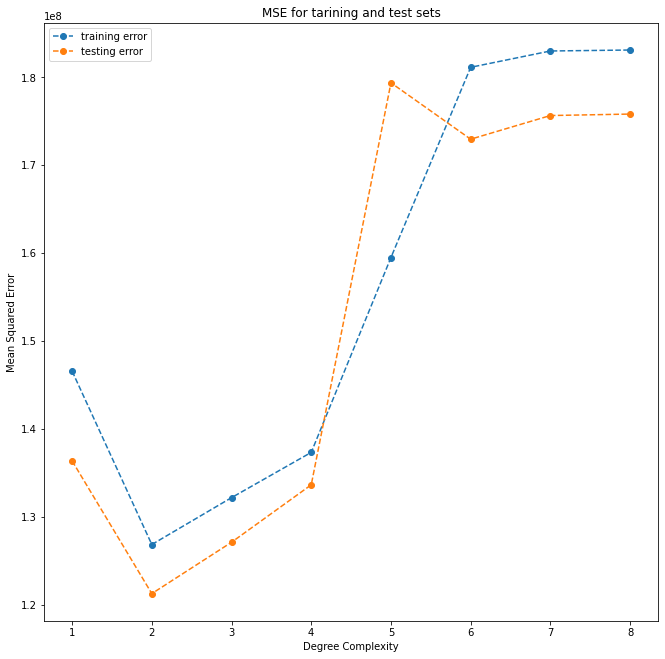

In [20]:
train_mses = []
test_mses = []

X_train, X_test, y1_train, y1_test = train_test_split(cars[['odometer','year','cylinders']], cars['price'], 
                                                      random_state = 32, test_size=.3)

for i in range(1, 9):
    pipe = Pipeline([('pfeat', PolynomialFeatures(degree = i, include_bias=False)), 
                    ('linreg', LinearRegression())])
    pipe.fit(X_train, y1_train)
    train_preds = pipe.predict(X_train)
    test_preds  = pipe.predict(X_test)
    train_mses.append(mean_squared_error(y1_train, train_preds))
    test_mses.append(mean_squared_error(y1_test, test_preds))

  
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
print(train_mses)
print(test_mses)
plt.figure(figsize = (11,11))
plt.plot(range(1, 9), train_mses, '--o', label = 'training error')
fig=plt.plot(range(1, 9), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 9), range(1, 9))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.title('MSE for tarining and test sets')
plt.legend()
plt.savefig("images/MSE_lr.png")

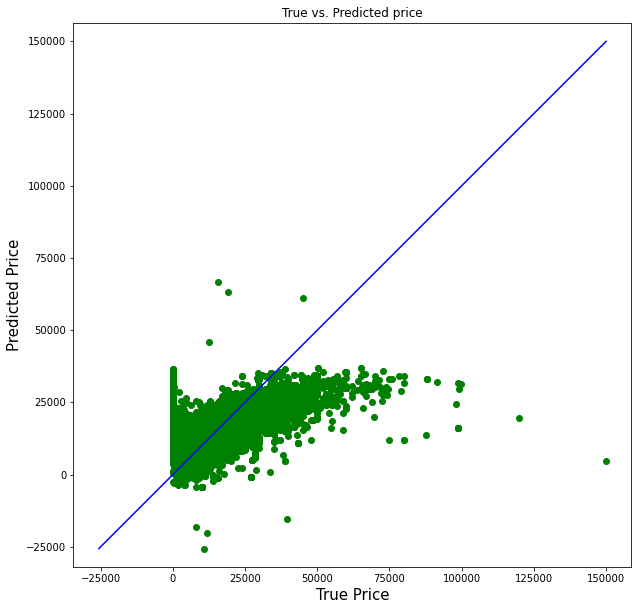

<Figure size 432x288 with 0 Axes>

In [21]:
pipe = Pipeline([('pfeat', PolynomialFeatures(degree = 2, include_bias=False)), 
                ('linreg', LinearRegression())])
pipe.fit(X_train, y1_train)
train_preds = pipe.predict(X_train)
test_preds  = pipe.predict(X_test)
train_mses.append(mean_squared_error(y1_train, train_preds))
test_mses.append(mean_squared_error(y1_test, test_preds))

plt.figure(figsize=(10,10))
plt.scatter(y1_test, test_preds, c='green')

p1 = max(max(test_preds), max(y1_test))
p2 = min(min(test_preds), min(y1_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('True Price', fontsize=15)
plt.ylabel('Predicted Price', fontsize=15)
plt.title('True vs. Predicted price')
plt.axis('equal')
plt.show()
plt.savefig("images/MSE_lr_predicted.png")

In [22]:
#pd.unique(cars['manufacturer'])
#pd.unique(cars['fuel'])
#pd.unique(cars['condition'])
#pd.unique(cars['title_status'])
#pd.unique(cars['transmission'])
#pd.unique(cars['drive'])
#pd.unique(cars['size'])
#pd.unique(cars['type'])

In [23]:
cols_to_drop = ['region','model','state','VIN','paint_color']
cars.drop(cols_to_drop,axis=1,inplace=True)

In [24]:
catogrial_features = ['manufacturer','fuel','condition','title_status','transmission','drive','size','type']
col_transformer = make_column_transformer((OneHotEncoder(sparse=False), catogrial_features), 
                                          remainder='passthrough',verbose_feature_names_out=False)

X_trans = col_transformer.fit_transform(cars)

pipe_1 = Pipeline([('col_transformer', col_transformer), 
                   ('linreg', LinearRegression())])

features_names = pipe_1.named_steps["col_transformer"].get_feature_names_out()

df_ohe = pd.DataFrame(X_trans, columns = features_names)

print(df_ohe.head())

   manufacturer_acura  manufacturer_alfa-romeo  manufacturer_aston-martin  \
0                 0.0                      0.0                        0.0   
1                 0.0                      0.0                        0.0   
2                 0.0                      0.0                        0.0   
3                 0.0                      0.0                        0.0   
4                 0.0                      0.0                        0.0   

   manufacturer_audi  manufacturer_bmw  manufacturer_buick  \
0                0.0               0.0                 0.0   
1                0.0               0.0                 0.0   
2                0.0               0.0                 0.0   
3                0.0               0.0                 0.0   
4                0.0               1.0                 0.0   

   manufacturer_cadillac  manufacturer_chevrolet  manufacturer_chrysler  \
0                    0.0                     1.0                    0.0   
1             

In [25]:
print(features_names)

['manufacturer_acura' 'manufacturer_alfa-romeo'
 'manufacturer_aston-martin' 'manufacturer_audi' 'manufacturer_bmw'
 'manufacturer_buick' 'manufacturer_cadillac' 'manufacturer_chevrolet'
 'manufacturer_chrysler' 'manufacturer_datsun' 'manufacturer_dodge'
 'manufacturer_ferrari' 'manufacturer_fiat' 'manufacturer_ford'
 'manufacturer_gmc' 'manufacturer_harley-davidson' 'manufacturer_honda'
 'manufacturer_hyundai' 'manufacturer_infiniti' 'manufacturer_jaguar'
 'manufacturer_jeep' 'manufacturer_kia' 'manufacturer_land rover'
 'manufacturer_lexus' 'manufacturer_lincoln' 'manufacturer_mazda'
 'manufacturer_mercedes-benz' 'manufacturer_mercury' 'manufacturer_mini'
 'manufacturer_mitsubishi' 'manufacturer_nissan' 'manufacturer_pontiac'
 'manufacturer_porsche' 'manufacturer_ram' 'manufacturer_rover'
 'manufacturer_saturn' 'manufacturer_subaru' 'manufacturer_tesla'
 'manufacturer_toyota' 'manufacturer_volkswagen' 'manufacturer_volvo'
 'fuel_diesel' 'fuel_electric' 'fuel_gas' 'fuel_hybrid' 'fuel_

In [26]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34772 entries, 0 to 34771
Data columns (total 85 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   manufacturer_acura            34772 non-null  float64
 1   manufacturer_alfa-romeo       34772 non-null  float64
 2   manufacturer_aston-martin     34772 non-null  float64
 3   manufacturer_audi             34772 non-null  float64
 4   manufacturer_bmw              34772 non-null  float64
 5   manufacturer_buick            34772 non-null  float64
 6   manufacturer_cadillac         34772 non-null  float64
 7   manufacturer_chevrolet        34772 non-null  float64
 8   manufacturer_chrysler         34772 non-null  float64
 9   manufacturer_datsun           34772 non-null  float64
 10  manufacturer_dodge            34772 non-null  float64
 11  manufacturer_ferrari          34772 non-null  float64
 12  manufacturer_fiat             34772 non-null  float64
 13  m

In [27]:
df_ohe.describe()

,manufacturer_acura,manufacturer_alfa-romeo,manufacturer_aston-martin,manufacturer_audi,manufacturer_bmw,manufacturer_buick,manufacturer_cadillac,manufacturer_chevrolet,manufacturer_chrysler,manufacturer_datsun,...,type_other,type_pickup,type_sedan,type_truck,type_van,type_wagon,price,year,cylinders,odometer
count,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,34772.00000,34772.000000,34772.000000,34772.000000,34772.000000,...,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,34772.000000,3.477200e+04
mean,0.007391,0.000431,0.000086,0.012941,0.026573,0.01113,0.014926,0.153371,0.015443,0.000086,...,0.002847,0.079144,0.236598,0.221155,0.050443,0.023899,15833.639883,2011.182906,6.031520,1.074786e+05
std,0.085654,0.020766,0.009288,0.113024,0.160834,0.10491,0.121258,0.360349,0.123310,0.009288,...,0.053283,0.269967,0.425000,0.415031,0.218860,0.152735,13451.235353,7.123117,1.689115,9.998117e+04
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1905.000000,3.000000,0.000000e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6500.000000,2008.000000,4.000000,6.535200e+04
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12000.000000,2013.000000,6.000000,1.041910e+05
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22106.250000,2016.000000,8.000000,1.412640e+05
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,155000.000000,2022.000000,12.000000,9.999999e+06


In [28]:
df_ohe.head()

,manufacturer_acura,manufacturer_alfa-romeo,manufacturer_aston-martin,manufacturer_audi,manufacturer_bmw,manufacturer_buick,manufacturer_cadillac,manufacturer_chevrolet,manufacturer_chrysler,manufacturer_datsun,...,type_other,type_pickup,type_sedan,type_truck,type_van,type_wagon,price,year,cylinders,odometer
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2018.0,6.0,68472.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2019.0,6.0,69125.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2018.0,6.0,66555.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,4000.0,2002.0,4.0,155000.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,2500.0,1995.0,6.0,110661.0


array([[<AxesSubplot:title={'center':'manufacturer_acura'}>,
        <AxesSubplot:title={'center':'manufacturer_alfa-romeo'}>,
        <AxesSubplot:title={'center':'manufacturer_aston-martin'}>],
       [<AxesSubplot:title={'center':'manufacturer_audi'}>,
        <AxesSubplot:title={'center':'manufacturer_bmw'}>,
        <AxesSubplot:title={'center':'manufacturer_buick'}>],
       [<AxesSubplot:title={'center':'manufacturer_cadillac'}>,
        <AxesSubplot:title={'center':'manufacturer_chevrolet'}>,
        <AxesSubplot:title={'center':'manufacturer_chrysler'}>],
       [<AxesSubplot:title={'center':'manufacturer_datsun'}>,
        <AxesSubplot:title={'center':'manufacturer_dodge'}>,
        <AxesSubplot:title={'center':'manufacturer_ferrari'}>],
       [<AxesSubplot:title={'center':'manufacturer_fiat'}>,
        <AxesSubplot:title={'center':'manufacturer_ford'}>,
        <AxesSubplot:title={'center':'manufacturer_gmc'}>],
       [<AxesSubplot:title={'center':'manufacturer_harley-davi

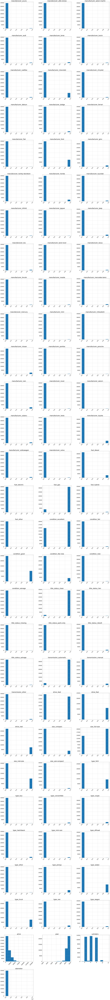

In [29]:
import matplotlib
params = {'axes.titlesize':'32',
          'xtick.labelsize':'24',
          'ytick.labelsize':'24'}
matplotlib.rcParams.update(params)
df_ohe.hist(figsize=(40,400), layout=(30,3),xrot=45)

In [30]:
pd.set_option('display.max_rows', 100)
df_ohe.corr()[['price']].sort_values(by=['price'], ascending=False)

,price
price,1.000000
fuel_diesel,0.389379
type_truck,0.340013
cylinders,0.308772
size_full-size,0.301891
drive_4wd,0.257426
year,0.254417
manufacturer_ford,0.182609
condition_like new,0.146312
manufacturer_ram,0.142932


The Complexity that minimized Test Error was: 3
[122052800.41238664, 94156674.44451196, 82907816.60852273, 78444302.88711695, 74733652.8463625, 71760685.2594915, 68692795.1622351]
[112959960.89932941, 90355213.68566984, 82793732.39471903, 140013132.00274038, 6.353662846966455e+26, 3.100854218787697e+26, 2.1958209014459005e+27]


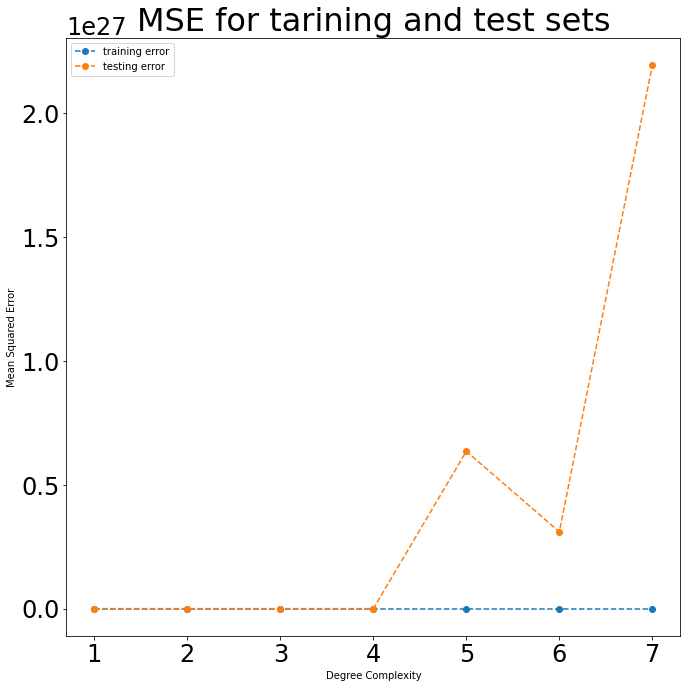

In [31]:
train_mses = []
test_mses = []

X_train, X_test, y1_train, y1_test = train_test_split(df_ohe[['fuel_diesel','type_truck','size_full-size','drive_4wd',
                                                            'odometer','year','cylinders']], df_ohe['price'], 
                                                      random_state = 32, test_size=.3)

for i in range(1, 8):
    pipe = Pipeline([('pfeat', PolynomialFeatures(degree = i, include_bias=False)), 
                     ('scaler', StandardScaler()),
                     ('linreg', LinearRegression())])
    pipe.fit(X_train, y1_train)
    train_preds = pipe.predict(X_train)
    test_preds  = pipe.predict(X_test)
    train_mses.append(mean_squared_error(y1_train, train_preds))
    test_mses.append(mean_squared_error(y1_test, test_preds))

  
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
print(train_mses)
print(test_mses)
plt.figure(figsize = (11,11))
plt.plot(range(1, 8), train_mses, '--o', label = 'training error')
plt.plot(range(1, 8), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 8), range(1, 8))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.title('MSE for tarining and test sets')
plt.legend()
plt.savefig("images/MSE_lr_ss_poly.png")

In [32]:
X = df_ohe.drop(['price'], axis = 1)
y = df_ohe['price']

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42, test_size=.3)

The Complexity that minimized Test Error was: 2
[106016541.66524486, 80878647.13673942]
[1.7918212453061574e+17, 596880331.5929427]


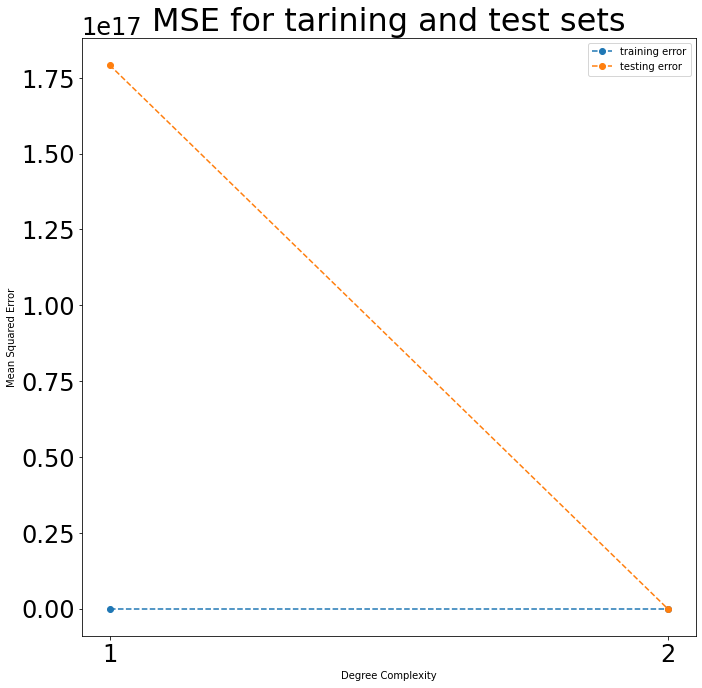

In [34]:
train_mses = []
test_mses = []

for i in range(1, 3):
    pipe = Pipeline([('pfeat', PolynomialFeatures(degree = i, include_bias=False)), 
                     #('scaler', StandardScaler()),
                     ('linreg', LinearRegression())])
    pipe.fit(X_train, y_train)
    train_preds = pipe.predict(X_train)
    test_preds  = pipe.predict(X_test)
    train_mses.append(mean_squared_error(y_train, train_preds))
    test_mses.append(mean_squared_error(y_test, test_preds))

  
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
print(train_mses)
print(test_mses)
plt.figure(figsize = (11,11))
plt.plot(range(1, 3), train_mses, '--o', label = 'training error')
plt.plot(range(1, 3), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 3), range(1,3))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.title('MSE for tarining and test sets')
plt.legend()
plt.savefig("images/MSE_lr_ss_poly_all.png")

In [35]:
ridge_param_dict = {'ridge__alpha': np.linspace(1, 30, 100)}

ridge_pipe = Pipeline([('scaler', StandardScaler()), ('ridge', Ridge())])
ridge_grid = GridSearchCV(ridge_pipe, param_grid=ridge_param_dict)
ridge_grid.fit(X_train, y_train)

ridge_train_preds = ridge_grid.predict(X_train)
ridge_test_preds = ridge_grid.predict(X_test)
ridge_train_mse = mean_squared_error(y_train, ridge_train_preds)
ridge_test_mse = mean_squared_error(y_test, ridge_test_preds)

# ANSWER CHECK
print(f'Train MSE: {ridge_train_mse}')
print(f'Test MSE: {ridge_test_mse}')

Train MSE: 106016595.0938154
Test MSE: 100856392.16772507


In [36]:
best_alpha = ridge_grid.best_params_
print(f'Best alpha: {list(best_alpha.values())[0]}')

Best alpha: 30.0


In [37]:
best_estimator = ridge_grid.best_estimator_
best_model = best_estimator.named_steps['ridge']
coefs = best_model.coef_

ridge_coeff = ridge_grid.best_estimator_.named_steps['ridge'].coef_
feature_names = X_train.columns;

df = pd.DataFrame(columns = ['Feature name', 'Ridge coeff'])
df['Feature name'] = feature_names
df['Ridge coeff'] = ridge_coeff
df.sort_values(by=['Ridge coeff'],ascending=False, inplace=True)
print(df)

                    Feature name  Ridge coeff
81                          year  3198.105424
41                   fuel_diesel  1951.224784
49            condition_like new  1303.467218
11          manufacturer_ferrari  1283.704556
78                    type_truck  1179.189855
82                     cylinders  1135.558648
32          manufacturer_porsche  1046.396292
65                size_full-size   947.618366
61                     drive_4wd   945.829154
71                    type_coupe   889.471127
59           transmission_manual   754.329655
70              type_convertible   652.847468
50                 condition_new   606.357720
76                   type_pickup   519.487174
34            manufacturer_rover   445.885318
79                      type_van   331.882270
53             title_status_lien   310.097318
38           manufacturer_toyota   300.744802
23            manufacturer_lexus   253.728989
26    manufacturer_mercedes-benz   210.831924
1        manufacturer_alfa-romeo  

In [38]:
model = best_model.fit(X_train, y_train)
score = model.score(X_train, y_train)
print(f'score: {score}')

r = permutation_importance(model, X_train, y_train,
                            n_repeats=30,
                            random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if i < len(feature_names):
        print(f"{X_train.columns[i]:<8}"
               f"{r.importances_mean[i]: .3f}"
               f" +/- {r.importances_std[i]:.3f}")

score: 0.4128668886714879
year     0.111 +/- 0.003
fuel_diesel 0.065 +/- 0.001
odometer 0.042 +/- 0.001
size_full-size 0.022 +/- 0.001
type_sedan 0.020 +/- 0.001
cylinders 0.015 +/- 0.001
transmission_manual 0.015 +/- 0.001
condition_like new 0.013 +/- 0.001
transmission_other 0.013 +/- 0.001
drive_fwd 0.012 +/- 0.001
fuel_gas 0.012 +/- 0.001
type_SUV 0.012 +/- 0.001
drive_4wd 0.011 +/- 0.001
type_truck 0.009 +/- 0.001
manufacturer_porsche 0.008 +/- 0.001
condition_good 0.007 +/- 0.001
type_coupe 0.006 +/- 0.001
type_wagon 0.005 +/- 0.001
type_convertible 0.005 +/- 0.000
condition_excellent 0.004 +/- 0.000
transmission_automatic 0.004 +/- 0.000
condition_fair 0.003 +/- 0.000
manufacturer_nissan 0.003 +/- 0.000
manufacturer_ferrari 0.003 +/- 0.000
condition_new 0.003 +/- 0.000
size_compact 0.002 +/- 0.000
manufacturer_chrysler 0.002 +/- 0.000
manufacturer_dodge 0.002 +/- 0.000
type_hatchback 0.002 +/- 0.000
manufacturer_subaru 0.001 +/- 0.000
manufacturer_rover 0.001 +/- 0.000
type_pick

In [39]:
# Note: This step takes an amount of time. please be patient with it
#
selector_pipe = Pipeline([('selector', SequentialFeatureSelector(LinearRegression())),
                         ('lr', LinearRegression())])

param_dict = {'selector__n_features_to_select':[i for i in range(1,10)]} #range(1,23)
selector_grid = GridSearchCV(estimator = selector_pipe, 
                             param_grid  = param_dict)

selector_grid.fit(X_train, y_train)
train_preds = selector_grid.predict(X_train)
test_preds = selector_grid.predict(X_test)

selector_train_mse = mean_squared_error(y_train, train_preds)
selector_test_mse = mean_squared_error(y_test, test_preds)
best_n_features_to_select = selector_grid.best_params_

print(f'Train MSE: {selector_train_mse}')
print(f'Test MSE: {selector_test_mse}')
print(f'Best n features to select: {list(best_n_features_to_select.values())[0]}')

Train MSE: 117205666.85591243
Test MSE: 113123072.10124786
Best n features to select: 9


In [40]:
best_estimator = selector_grid.best_estimator_
best_selector = best_estimator.named_steps['selector']
best_model = best_estimator.named_steps['lr']
feature_names = X_train.columns[best_selector.get_support()]
lr_coefs = best_model.coef_

df_lr = pd.DataFrame(columns = ['Feature name', 'Lr coeff'])
df_lr['Feature name'] = feature_names
df_lr['Lr coeff']  = lr_coefs[0:len(feature_names)]
df_lr.sort_values(by=['Lr coeff'],ascending=False, inplace=True)
print(df_lr)
print(len(feature_names))

           Feature name      Lr coeff
0  manufacturer_ferrari  86131.629500
1  manufacturer_porsche  18407.780895
2           fuel_diesel  14034.579737
3    condition_like new   5461.393097
6        size_full-size   2934.764727
8             cylinders   1189.005113
7                  year    491.656614
5             drive_fwd  -5166.977923
4    transmission_other -10516.896643
9


In [41]:
model = best_model.fit(X_train, y_train)
score = model.score(X_train, y_train)
print(f'score: {score}')

r = permutation_importance(model, X_train, y_train,
                            n_repeats=30,
                            random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if i < len(feature_names):
        print(f"{feature_names[i]:<8}"
               f"{r.importances_mean[i]: .3f}"
               f" +/- {r.importances_std[i]:.3f}")

score: 0.41998455654300393
year     869004992939.205 +/- 5811335957.860
transmission_other 176762591382.147 +/- 1040363181.065
cylinders 104150982230.724 +/- 663169015.500
size_full-size 100341633413.173 +/- 499405088.626
condition_like new 90566097673.554 +/- 749266698.610
drive_fwd 77466685540.497 +/- 577141472.968
manufacturer_ferrari 50026094302.668 +/- 294661711.916
manufacturer_porsche 2801015399.137 +/- 400.899
fuel_diesel-0.000 +/- 0.000


In [42]:
# Note: This step takes an amount of time. please be patient with it
#
selector_pipe_lasso = Pipeline([('selector', SequentialFeatureSelector(Lasso())),
                                ('lasso', Lasso())])

param_dict = {'selector__n_features_to_select':[i for i in range(1,10)]} #range(1,23)
selector_grid_lasso = GridSearchCV(estimator = selector_pipe_lasso, 
                                    param_grid  = param_dict)

selector_grid_lasso.fit(X_train, y_train)
train_preds_lasso = selector_grid_lasso.predict(X_train)
test_preds_lasso = selector_grid_lasso.predict(X_test)

selector_train_mse_lasso = mean_squared_error(y_train, train_preds_lasso)
selector_test_mse_lasso = mean_squared_error(y_test, test_preds_lasso)
best_n_features_to_select_lasso = selector_grid_lasso.best_params_

print(f'Train MSE: {selector_train_mse_lasso}')
print(f'Test MSE: {selector_test_mse_lasso}')
print(f'Best n features to select: {list(best_n_features_to_select_lasso.values())[0]}')

Train MSE: 117210087.81982058
Test MSE: 113035917.87307632
Best n features to select: 9


In [43]:
best_estimator = selector_grid_lasso.best_estimator_
best_selector = best_estimator.named_steps['selector']
best_model = best_estimator.named_steps['lasso']
feature_names = X_train.columns[best_selector.get_support()]
coefs = best_model.coef_

df_lasso = pd.DataFrame(columns = ['Feature name', 'Lasso coeff'])
df_lasso['Feature name'] = feature_names
df_lasso['Lasso coeff']  = coefs[0:len(feature_names)]
df_lasso.sort_values(by=['Lasso coeff'],ascending=False, inplace=True)
print(df_lasso)
print(len(feature_names))

           Feature name   Lasso coeff
0  manufacturer_ferrari  82055.539858
1  manufacturer_porsche  18151.771509
2           fuel_diesel  14022.076322
3    condition_like new   5454.503101
6        size_full-size   2929.038936
8             cylinders   1190.651793
7                  year    491.385661
5             drive_fwd  -5163.447600
4    transmission_other -10455.386327
9


In [44]:
model = best_model.fit(X_train, y_train)
score = model.score(X_train, y_train)
print(f'score: {score}')

r = permutation_importance(model, X_train, y_train,
                            n_repeats=30,
                            random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if i < len(feature_names):
        print(f"{feature_names[i]:<8}"
               f"{r.importances_mean[i]: .8f}"
               f" +/- {r.importances_std[i]:.8f}")

score: 0.4198008175424963
cylinders 0.00115504 +/- 0.00017993
manufacturer_porsche 0.00035559 +/- 0.00012828
transmission_other 0.00013212 +/- 0.00006795
condition_like new 0.00011683 +/- 0.00006791
size_full-size 0.00010375 +/- 0.00006202
year     0.00003070 +/- 0.00003704
fuel_diesel 0.00000000 +/- 0.00000000
drive_fwd 0.00000000 +/- 0.00000000
manufacturer_ferrari 0.00000000 +/- 0.00000000


In [45]:
# Note: This step takes an amount of time. please be patient with it
#
selector_pipe_lasso = Pipeline([('poly', PolynomialFeatures(degree=2, include_bias=False)), 
                                ('scaler', StandardScaler()),
                                ('lasso', Lasso())])

selector_pipe_lasso.fit(X_train, y_train)
train_preds_lasso = selector_pipe_lasso.predict(X_train)
test_preds_lasso = selector_pipe_lasso.predict(X_test)

selector_train_mse_lasso = mean_squared_error(y_train, train_preds_lasso)
selector_test_mse_lasso = mean_squared_error(y_test, test_preds_lasso)

print(f'Train MSE: {selector_train_mse_lasso}')
print(f'Test MSE: {selector_test_mse_lasso}')

C:\Users\hossa\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.569e+11, tolerance: 4.449e+08



Train MSE: 73736554.05112839
Test MSE: 93874111.76315011


In [46]:
best_model = selector_pipe_lasso.named_steps['lasso']
coefs = best_model.coef_
feature_names = X_train.columns

df_lasso = pd.DataFrame(columns = ['Feature name', 'Lasso coeff'])
df_lasso['Feature name'] = feature_names
df_lasso['Lasso coeff']  = coefs[0:len(feature_names)]
df_lasso.sort_values(by=['Lasso coeff'],ascending=False, inplace=True)
print(df_lasso)
print(len(feature_names))

                    Feature name  Lasso coeff
41                   fuel_diesel  4376.018539
63                     drive_rwd  2511.558391
32          manufacturer_porsche  2268.425490
13             manufacturer_ford  1972.455004
26    manufacturer_mercedes-benz  1429.596844
29       manufacturer_mitsubishi  1359.654491
11          manufacturer_ferrari  1222.140909
78                    type_truck  1100.489942
31          manufacturer_pontiac   908.490322
59           transmission_manual   872.238422
76                   type_pickup   834.656564
40            manufacturer_volvo   749.575832
74                  type_offroad   517.075135
33              manufacturer_ram   479.018707
79                      type_van   370.444609
65                size_full-size   346.798847
75                    type_other   254.007831
34            manufacturer_rover   240.581232
71                    type_coupe   150.876435
1        manufacturer_alfa-romeo   144.931630
9            manufacturer_datsun  

In [47]:
model = best_model.fit(X_train, y_train)
score = model.score(X_train, y_train)
print(f'score: {score}')

r = permutation_importance(model, X_train, y_train,
                            n_repeats=30,
                            random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if i < len(feature_names):
        print(f"{feature_names[i]:<8}"
               f"{r.importances_mean[i]: .8f}"
               f" +/- {r.importances_std[i]:.8f}")

score: 0.4198008175424963
fuel_diesel 0.11883588 +/- 0.00213299
year     0.11198753 +/- 0.00263502
odometer 0.04135759 +/- 0.00137010
type_sedan 0.03336416 +/- 0.00116645
condition_like new 0.02451925 +/- 0.00120265
type_SUV 0.02360657 +/- 0.00098519
size_full-size 0.02292873 +/- 0.00070670
transmission_other 0.02282619 +/- 0.00102234
manufacturer_ferrari 0.01710308 +/- 0.00093846
cylinders 0.01440978 +/- 0.00071329
drive_fwd 0.01384845 +/- 0.00070563
manufacturer_porsche 0.01244212 +/- 0.00075331
drive_4wd 0.00852811 +/- 0.00052661
type_wagon 0.00757881 +/- 0.00064739
transmission_manual 0.00492310 +/- 0.00047521
condition_new 0.00460581 +/- 0.00039743
type_coupe 0.00369968 +/- 0.00057766
type_hatchback 0.00330194 +/- 0.00030935
type_truck 0.00319440 +/- 0.00036322
manufacturer_rover 0.00226184 +/- 0.00027523
type_mini-van 0.00209917 +/- 0.00032663
type_convertible 0.00202022 +/- 0.00027123
condition_fair 0.00188710 +/- 0.00028406
size_compact 0.00168478 +/- 0.00025180
manufacturer_to

In [48]:
cars_new = df_ohe.drop(['price'], axis = 1)

In [49]:
cars_new.head()

,manufacturer_acura,manufacturer_alfa-romeo,manufacturer_aston-martin,manufacturer_audi,manufacturer_bmw,manufacturer_buick,manufacturer_cadillac,manufacturer_chevrolet,manufacturer_chrysler,manufacturer_datsun,...,type_offroad,type_other,type_pickup,type_sedan,type_truck,type_van,type_wagon,year,cylinders,odometer
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2018.0,6.0,68472.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2019.0,6.0,69125.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2018.0,6.0,66555.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2002.0,4.0,155000.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1995.0,6.0,110661.0


In [50]:
mu = cars_new.mean()
std = cars_new.std()
print(mu)
print(std)

manufacturer_acura                   0.007391
manufacturer_alfa-romeo              0.000431
manufacturer_aston-martin            0.000086
manufacturer_audi                    0.012941
manufacturer_bmw                     0.026573
manufacturer_buick                   0.011130
manufacturer_cadillac                0.014926
manufacturer_chevrolet               0.153371
manufacturer_chrysler                0.015443
manufacturer_datsun                  0.000086
manufacturer_dodge                   0.028126
manufacturer_ferrari                 0.000288
manufacturer_fiat                    0.001409
manufacturer_ford                    0.212671
manufacturer_gmc                     0.044346
manufacturer_harley-davidson         0.000201
manufacturer_honda                   0.054469
manufacturer_hyundai                 0.021943
manufacturer_infiniti                0.007305
manufacturer_jaguar                  0.002502
manufacturer_jeep                    0.039256
manufacturer_kia                  

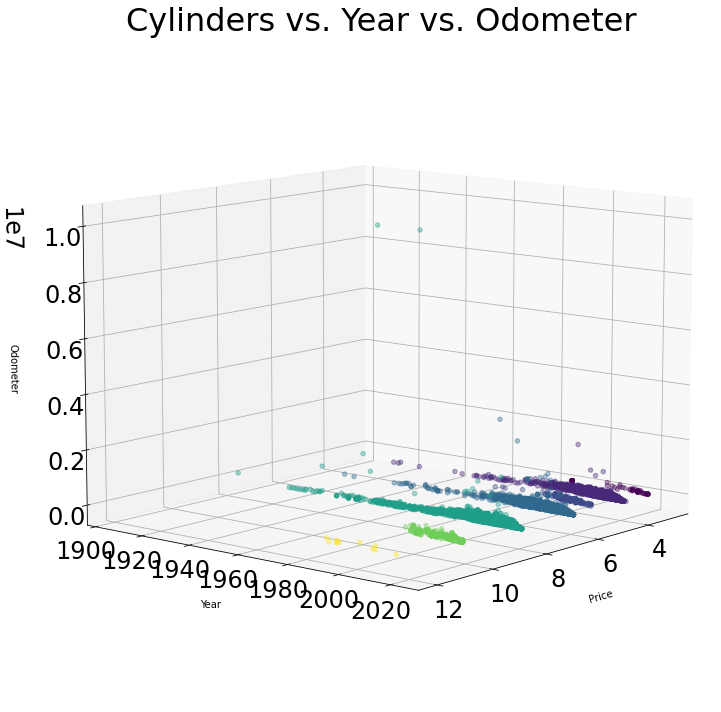

In [51]:
plt.figure(figsize = (10,10))
ax = plt.axes(projection = '3d')
ax.scatter3D(cars_new['cylinders'], cars_new['year'], cars_new['odometer'], c = cars_new['cylinders'], alpha = 0.4)
ax.set_xlabel('Price', labelpad = 20)
ax.set_ylabel('Year', labelpad = 20)
ax.set_zlabel('Odometer', labelpad = 20)
ax.view_init(10, 40)
plt.title('Cylinders vs. Year vs. Odometer')
plt.tight_layout();
plt.savefig("images/3D_scatter.png")

In [52]:
cars_norm = (cars_new - cars_new.mean())/cars_new.std()
U, sigma, VT = svd(cars_norm,  full_matrices=False)
Sigma = np.diag(sigma)

In [53]:
r= 3
Ur = U[:,:r]
Sigmar = Sigma[:r,:r]
Xrr_3 = pd.DataFrame(Ur @ Sigmar, columns = [f'pca_{i}' for i in range(1, r + 1)])
Xrr_3

,pca_1,pca_2,pca_3
0,-0.880491,-1.216353,1.501896
1,-0.881308,-1.176607,1.513357
2,-0.879746,-1.215437,1.501750
3,3.021647,-0.097485,0.906349
4,1.577883,-2.397324,-0.216903
...,...,...,...
34767,2.518454,-0.240039,1.475470
34768,-3.774860,0.418339,0.630480
34769,2.508403,0.660258,1.040414
34770,0.458407,-4.473875,-0.382400


In [54]:
Xrr_3['price'] = df_ohe['price']
Xrr_3

,pca_1,pca_2,pca_3,price
0,-0.880491,-1.216353,1.501896,0.0
1,-0.881308,-1.176607,1.513357,0.0
2,-0.879746,-1.215437,1.501750,0.0
3,3.021647,-0.097485,0.906349,4000.0
4,1.577883,-2.397324,-0.216903,2500.0
...,...,...,...,...
34767,2.518454,-0.240039,1.475470,12995.0
34768,-3.774860,0.418339,0.630480,32999.0
34769,2.508403,0.660258,1.040414,15999.0
34770,0.458407,-4.473875,-0.382400,6800.0


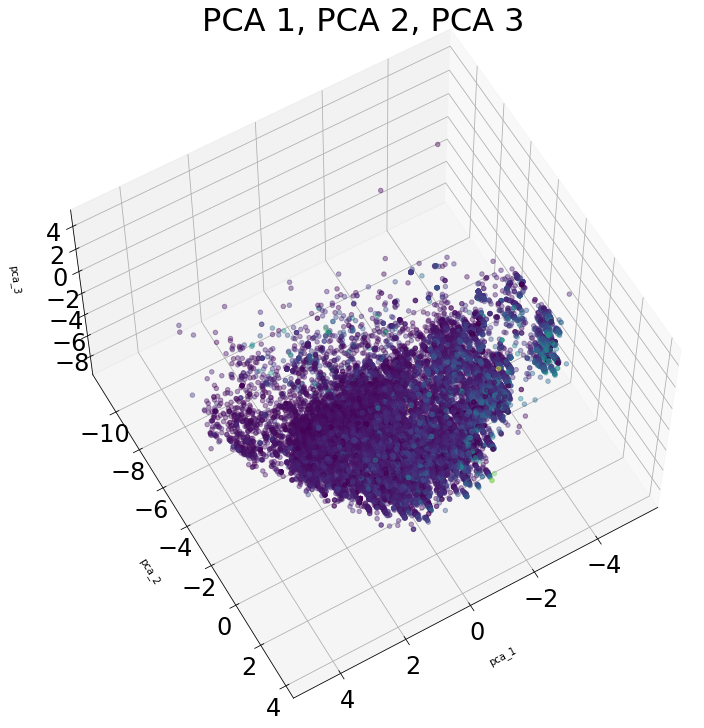

In [55]:
plt.figure(figsize = (10,10))
ax = plt.axes(projection = '3d')
ax.scatter3D(Xrr_3['pca_1'], Xrr_3['pca_2'], Xrr_3['pca_3'], c=Xrr_3['price'], alpha = 0.4)
ax.set_xlabel('pca_1', labelpad = 20)
ax.set_ylabel('pca_2', labelpad = 20)
ax.set_zlabel('pca_3', labelpad = 20)
ax.view_init(60, 60)
#plt.title('Test')
plt.title('PCA 1, PCA 2, PCA 3');
plt.tight_layout();
plt.savefig("images/3D_scatter_PCA.png")

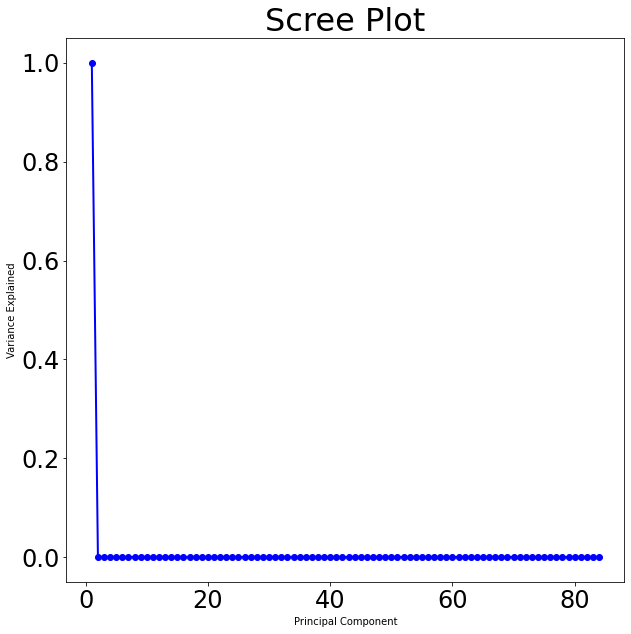

<Figure size 432x288 with 0 Axes>

In [56]:
#The explained variance ratio is the percentage of variance that is attributed by each of the selected components. 
#Ideally, you would choose the number of components to include in your model by adding the explained variance ratio of 
#each component until you reach a total of around 0.8 or 80% to avoid overfitting.
#define PCA model to use
pca = PCA(n_components=len(cars_new.columns))

#fit PCA model to data
pca = pca.fit(cars_new)

PC_values = np.arange(pca.n_components_) + 1
plt.figure(figsize = (10,10))
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()
plt.savefig("images/Scree_PCA.png")

In [57]:
ans = int((np.cumsum(pca.explained_variance_ratio_) < 0.8).sum())
print(ans)

0


In [58]:
#define PCA model to use
pca = PCA(n_components=3)

#fit PCA model to data
pca = pca.fit(cars_new)
pca_loading = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=cars_new.columns)
pca_loading

,PC1,PC2,PC3
manufacturer_acura,1.059723e-08,-0.000103,-1.796966e-03
manufacturer_alfa-romeo,-3.071515e-09,-0.000040,-2.486390e-04
manufacturer_aston-martin,-7.808780e-10,-0.000011,2.962424e-05
manufacturer_audi,-1.505778e-08,0.000264,-3.607073e-03
manufacturer_bmw,-4.452826e-08,-0.000181,-8.949783e-04
manufacturer_buick,1.653822e-08,-0.000176,-2.744133e-03
manufacturer_cadillac,-1.834959e-08,-0.000397,3.382010e-03
manufacturer_chevrolet,-3.203208e-08,-0.001391,4.257840e-02
manufacturer_chrysler,7.601504e-10,-0.000350,-3.001532e-03
manufacturer_datsun,2.304027e-10,-0.000066,-5.156255e-05


In [59]:
print('Variance of each component:', pca.explained_variance_ratio_)
print('Total Variance Explained:', sum(list(pca.explained_variance_ratio_))*100)

Variance of each component: [9.99999995e-01 4.83467050e-09 3.10230993e-10]
Total Variance Explained: 99.99999996464992


In [60]:
cars_norm = (cars_new - cars_new.mean())/cars_new.std()
U, sigma, VT = svd(cars_norm)
percent_variance_explained = sigma/sigma.sum()
ans = int((np.cumsum(percent_variance_explained) < .8).sum())
print(ans)

57


In [61]:
print(percent_variance_explained)

[2.64100997e-02 2.01971130e-02 1.93483197e-02 1.89448548e-02
 1.81525333e-02 1.70992962e-02 1.58575818e-02 1.56387252e-02
 1.52376188e-02 1.48443066e-02 1.47525321e-02 1.44716879e-02
 1.44288469e-02 1.43069001e-02 1.41089191e-02 1.40203527e-02
 1.38156657e-02 1.37401430e-02 1.35896010e-02 1.34782787e-02
 1.33982544e-02 1.33923612e-02 1.33424077e-02 1.32705432e-02
 1.31918877e-02 1.31417401e-02 1.31250566e-02 1.30913115e-02
 1.30382499e-02 1.29943009e-02 1.29680009e-02 1.29408715e-02
 1.29132189e-02 1.29014031e-02 1.28769751e-02 1.28646162e-02
 1.28550339e-02 1.28429783e-02 1.28299102e-02 1.28226217e-02
 1.28129159e-02 1.28061549e-02 1.28031652e-02 1.27904431e-02
 1.27812378e-02 1.27697724e-02 1.27640666e-02 1.27445399e-02
 1.27282922e-02 1.26925921e-02 1.26502264e-02 1.25980737e-02
 1.25466065e-02 1.25014322e-02 1.23814755e-02 1.22529048e-02
 1.22471157e-02 1.22122545e-02 1.21280855e-02 1.20917935e-02
 1.20064739e-02 1.18304251e-02 1.16223821e-02 1.15469176e-02
 1.14591467e-02 1.115672

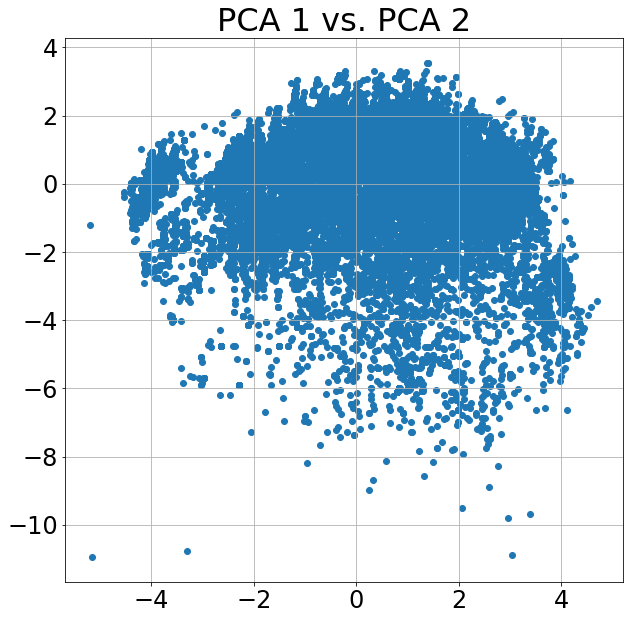

In [62]:
plt.figure(figsize = (10,10))
plt.scatter(Xrr_3['pca_1'], Xrr_3['pca_2'])
plt.grid();
plt.title('PCA 1 vs. PCA 2');
plt.savefig("images/PCA_1_PCA_2.png")

In [63]:
#create DataFrame of samples
df_cluster = Xrr_3[['pca_1', 'pca_2', 'pca_3']]
df_cluster.head()

,pca_1,pca_2,pca_3
0,-0.880491,-1.216353,1.501896
1,-0.881308,-1.176607,1.513357
2,-0.879746,-1.215437,1.501750
3,3.021647,-0.097485,0.906349
4,1.577883,-2.397324,-0.216903


In [64]:
centroids = df_cluster.sample(3, random_state = 11).reset_index(drop = True)
centroids

,pca_1,pca_2,pca_3
0,-0.333655,-1.160621,-0.679531
1,1.070135,0.316800,1.539727
2,-0.878556,0.653683,-0.792876


In [65]:
c1 = centroids.iloc[0, :2].values
c2 = centroids.iloc[1, :2].values
c3 = centroids.iloc[2, :2].values

In [66]:
d1 = np.linalg.norm(df_cluster.iloc[:, :2] - c1, axis = 1)**2
d2 = np.linalg.norm(df_cluster.iloc[:, :2] - c2, axis = 1)**2
d3 = np.linalg.norm(df_cluster.iloc[:, :2] - c3, axis = 1)**2

In [67]:
dist_df = pd.DataFrame(np.array([d1, d2, d3]).T, columns = ['d1', 'd2', 'd3'])
dist_df

,d1,d2,d3
0,0.302136,6.155500,3.497037
1,0.300180,6.038395,3.349970
2,0.301221,6.149788,3.493611
3,12.388306,3.980029,15.775833
4,5.183411,7.624273,15.342733
...,...,...,...
34767,8.982000,2.407698,12.338418
34768,14.335006,23.484287,8.443963
34769,11.392893,2.186577,11.471532
34770,11.605015,23.324776,28.079322


In [68]:
np.argmin(dist_df.values, axis = 1) #finding smallest variance
df_cluster['cluster label'] = np.argmin(dist_df.values, axis = 1) #create new column of labels
df_cluster

,pca_1,pca_2,pca_3,cluster label
0,-0.880491,-1.216353,1.501896,0
1,-0.881308,-1.176607,1.513357,0
2,-0.879746,-1.215437,1.501750,0
3,3.021647,-0.097485,0.906349,1
4,1.577883,-2.397324,-0.216903,0
...,...,...,...,...
34767,2.518454,-0.240039,1.475470,1
34768,-3.774860,0.418339,0.630480,2
34769,2.508403,0.660258,1.040414,1
34770,0.458407,-4.473875,-0.382400,0


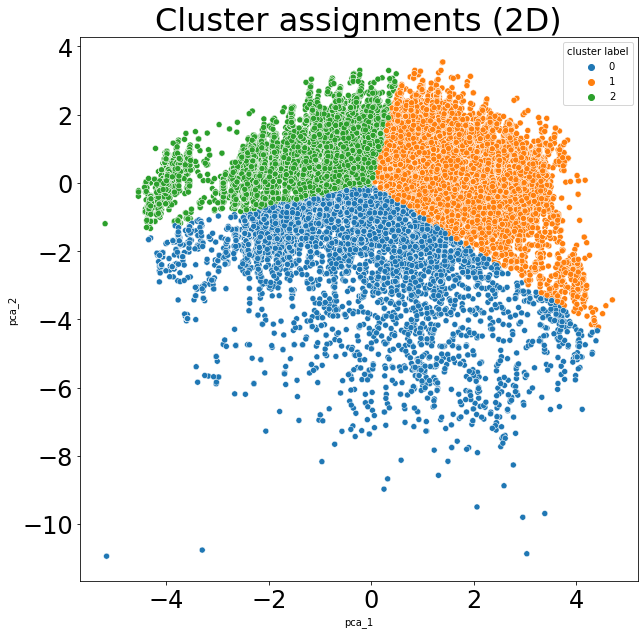

In [69]:
plt.figure(figsize = (10,10))
sns.scatterplot(data = df_cluster, x = 'pca_1',y = 'pca_2', hue = 'cluster label', palette='tab10')
plt.title('Cluster assignments (2D)');
plt.savefig("images/Cluster.png")

In [70]:
c1 = centroids.iloc[0, :3].values
c2 = centroids.iloc[1, :3].values
c3 = centroids.iloc[2, :3].values
d1 = np.linalg.norm(df_cluster.iloc[:, :3] - c1, axis = 1)**2
d2 = np.linalg.norm(df_cluster.iloc[:, :3] - c2, axis = 1)**2
d3 = np.linalg.norm(df_cluster.iloc[:, :3] - c3, axis = 1)**2
dist_df = pd.DataFrame(np.array([d1, d2, d3]).T, columns = ['d1', 'd2', 'd3'])
dist_df
np.argmin(dist_df.values, axis = 1) #finding smallest variance
df_cluster['cluster label'] = np.argmin(dist_df.values, axis = 1) #create new column of labels
df_cluster

,pca_1,pca_2,pca_3,cluster label
0,-0.880491,-1.216353,1.501896,0
1,-0.881308,-1.176607,1.513357,0
2,-0.879746,-1.215437,1.501750,0
3,3.021647,-0.097485,0.906349,1
4,1.577883,-2.397324,-0.216903,0
...,...,...,...,...
34767,2.518454,-0.240039,1.475470,1
34768,-3.774860,0.418339,0.630480,2
34769,2.508403,0.660258,1.040414,1
34770,0.458407,-4.473875,-0.382400,0


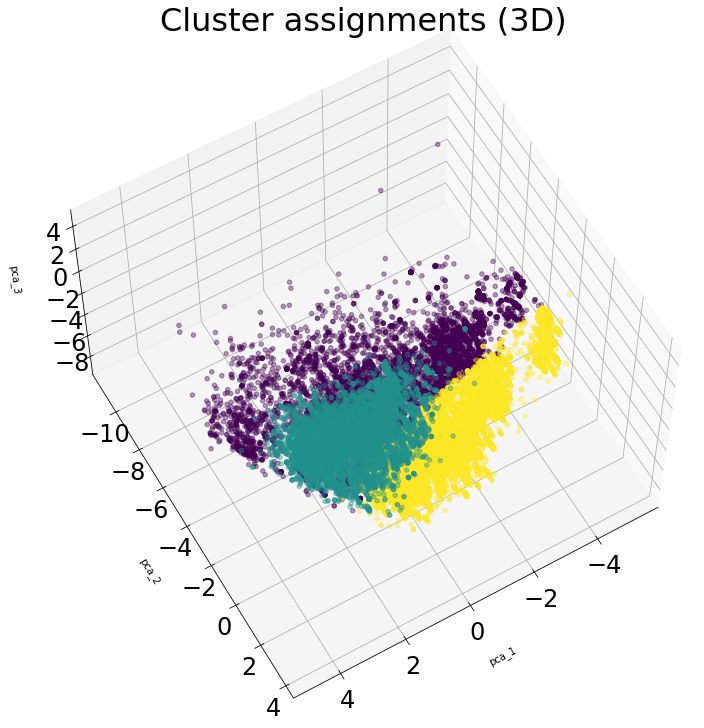

In [71]:
plt.figure(figsize = (10,10))
ax = plt.axes(projection = '3d')
ax.scatter3D(df_cluster['pca_1'], df_cluster['pca_2'], df_cluster['pca_3'], c=df_cluster['cluster label'], alpha = 0.4)
ax.set_xlabel('pca_1', labelpad = 20)
ax.set_ylabel('pca_2', labelpad = 20)
ax.set_zlabel('pca_3', labelpad = 20)
ax.view_init(60, 60)
plt.title('Cluster assignments (3D)');
plt.tight_layout();
plt.savefig("images/3D_Cluster.png")

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

`In the above, We analyzed a dataset for car priced based on many features. The features are big in numbers and we 
used to use different techniques or models to analyze and study which features affects the car price the most.
We used many models of varying complexities. We used the pairwise autocorrelation to see which feature is highly
correlated with the car price. We used linear regression, Ridge, Lasso and with different polynomial degrees and standard scaler.
We cross-validated each model and find the mean square error for the training and test datasets. We listed the important features given by each model.
We also used Principal component Analysis (PCA) and grouped the data into three distinguished groups.'

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

`1- The number of features is huge that can influence car prices. Based on our finding and model, we find the following features gives a good estimate and prediction
of car price:
fuel_diesel, type_truck , size_full-size, drive_4wd, odometer, year, cylinders

2- All models used agree on the following features as big influencer of car price. Thus, car dealers can depend on these features to estimate car price:
size_full-size, year, cylinders

3- In addition, the following two features can be used as well:
fuel_diesel, odometer`

`Using machine learning terms, the following features with polynomila degree of 3 and linear regression, gives the minimum MSE for both training and test sets:
fuel_diesel, type_truck, size_full-size, drive_4wd, odometer, year, cylinders

A Lasso model with polynomial degree of 2 and standard scaler gives the second-best training and test MSE'